In [1]:
# Importing necessary libraries

import numpy as np
import pandas as pd
import os
import random
import ntpath
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from sklearn.model_selection import train_test_split
import cv2
from tensorflow import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D
from imgaug import augmenters as iaa


In [2]:
# Loading and reading the data
df = pd.read_csv("driving_log.csv", header=None,names=['Center','Left','Right','Steering','Throttle','Reverse','Speed'])
df

,Center,Left,Right,Steering,Throttle,Reverse,Speed
0,C:\Users\divya\Downloads\simulator-windows-64\...,C:\Users\divya\Downloads\simulator-windows-64...,C:\Users\divya\Downloads\simulator-windows-64...,0.0,0.0,0.0,0.000080
1,C:\Users\divya\Downloads\simulator-windows-64\...,C:\Users\divya\Downloads\simulator-windows-64...,C:\Users\divya\Downloads\simulator-windows-64...,0.0,0.0,0.0,0.000082
2,C:\Users\divya\Downloads\simulator-windows-64\...,C:\Users\divya\Downloads\simulator-windows-64...,C:\Users\divya\Downloads\simulator-windows-64...,0.0,0.0,0.0,0.000080
3,C:\Users\divya\Downloads\simulator-windows-64\...,C:\Users\divya\Downloads\simulator-windows-64...,C:\Users\divya\Downloads\simulator-windows-64...,0.0,0.0,0.0,0.000078
4,C:\Users\divya\Downloads\simulator-windows-64\...,C:\Users\divya\Downloads\simulator-windows-64...,C:\Users\divya\Downloads\simulator-windows-64...,0.0,0.0,0.0,0.000081
...,...,...,...,...,...,...,...
4884,C:\Users\divya\Downloads\simulator-windows-64\...,C:\Users\divya\Downloads\simulator-windows-64...,C:\Users\divya\Downloads\simulator-windows-64...,0.0,0.0,0.0,0.001312
4885,C:\Users\divya\Downloads\simulator-windows-64\...,C:\Users\divya\Downloads\simulator-windows-64...,C:\Users\divya\Downloads\simulator-windows-64...,0.0,0.0,0.0,0.001328
4886,C:\Users\divya\Downloads\simulator-windows-64\...,C:\Users\divya\Downloads\simulator-windows-64...,C:\Users\divya\Downloads\simulator-windows-64...,0.0,0.0,0.0,0.001338
4887,C:\Users\divya\Downloads\simulator-windows-64\...,C:\Users\divya\Downloads\simulator-windows-64...,C:\Users\divya\Downloads\simulator-windows-64...,0.0,0.0,0.0,0.001322


In [3]:
# Running basic checks
df.head()

,Center,Left,Right,Steering,Throttle,Reverse,Speed
0,C:\Users\divya\Downloads\simulator-windows-64\...,C:\Users\divya\Downloads\simulator-windows-64...,C:\Users\divya\Downloads\simulator-windows-64...,0.0,0.0,0.0,0.000080
1,C:\Users\divya\Downloads\simulator-windows-64\...,C:\Users\divya\Downloads\simulator-windows-64...,C:\Users\divya\Downloads\simulator-windows-64...,0.0,0.0,0.0,0.000082
2,C:\Users\divya\Downloads\simulator-windows-64\...,C:\Users\divya\Downloads\simulator-windows-64...,C:\Users\divya\Downloads\simulator-windows-64...,0.0,0.0,0.0,0.000080
3,C:\Users\divya\Downloads\simulator-windows-64\...,C:\Users\divya\Downloads\simulator-windows-64...,C:\Users\divya\Downloads\simulator-windows-64...,0.0,0.0,0.0,0.000078
4,C:\Users\divya\Downloads\simulator-windows-64\...,C:\Users\divya\Downloads\simulator-windows-64...,C:\Users\divya\Downloads\simulator-windows-64...,0.0,0.0,0.0,0.000081


In [4]:
df.tail()

,Center,Left,Right,Steering,Throttle,Reverse,Speed
4884,C:\Users\divya\Downloads\simulator-windows-64\...,C:\Users\divya\Downloads\simulator-windows-64...,C:\Users\divya\Downloads\simulator-windows-64...,0.0,0.0,0.0,0.001312
4885,C:\Users\divya\Downloads\simulator-windows-64\...,C:\Users\divya\Downloads\simulator-windows-64...,C:\Users\divya\Downloads\simulator-windows-64...,0.0,0.0,0.0,0.001328
4886,C:\Users\divya\Downloads\simulator-windows-64\...,C:\Users\divya\Downloads\simulator-windows-64...,C:\Users\divya\Downloads\simulator-windows-64...,0.0,0.0,0.0,0.001338
4887,C:\Users\divya\Downloads\simulator-windows-64\...,C:\Users\divya\Downloads\simulator-windows-64...,C:\Users\divya\Downloads\simulator-windows-64...,0.0,0.0,0.0,0.001322
4888,C:\Users\divya\Downloads\simulator-windows-64\...,C:\Users\divya\Downloads\simulator-windows-64...,C:\Users\divya\Downloads\simulator-windows-64...,0.0,0.0,0.0,0.001327


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4889 entries, 0 to 4888
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Center    4889 non-null   object 
 1   Left      4889 non-null   object 
 2   Right     4889 non-null   object 
 3   Steering  4889 non-null   float64
 4   Throttle  4889 non-null   float64
 5   Reverse   4889 non-null   float64
 6   Speed     4889 non-null   float64
dtypes: float64(4), object(3)
memory usage: 267.5+ KB


In [6]:
# Retaining only the image names and removing the path for better readability

def path_leaf(path):
    head,tail = ntpath.split(path)
    return tail

df.Center = df.Center.apply(path_leaf)
df.Left = df.Left.apply(path_leaf)
df.Right = df.Right.apply(path_leaf)
df.head()

,Center,Left,Right,Steering,Throttle,Reverse,Speed
0,center_2024_03_11_17_35_48_728.jpg,left_2024_03_11_17_35_48_728.jpg,right_2024_03_11_17_35_48_728.jpg,0.0,0.0,0.0,0.000080
1,center_2024_03_11_17_35_49_109.jpg,left_2024_03_11_17_35_49_109.jpg,right_2024_03_11_17_35_49_109.jpg,0.0,0.0,0.0,0.000082
2,center_2024_03_11_17_35_49_347.jpg,left_2024_03_11_17_35_49_347.jpg,right_2024_03_11_17_35_49_347.jpg,0.0,0.0,0.0,0.000080
3,center_2024_03_11_17_35_49_600.jpg,left_2024_03_11_17_35_49_600.jpg,right_2024_03_11_17_35_49_600.jpg,0.0,0.0,0.0,0.000078
4,center_2024_03_11_17_35_49_825.jpg,left_2024_03_11_17_35_49_825.jpg,right_2024_03_11_17_35_49_825.jpg,0.0,0.0,0.0,0.000081


In [7]:
df.describe()

,Steering,Throttle,Reverse,Speed
count,4889.000000,4889.000000,4889.000000,4889.000000
mean,-0.016899,0.153439,0.001470,14.736687
std,0.276793,0.313013,0.034627,7.381162
min,-1.000000,0.000000,0.000000,0.000014
25%,0.000000,0.000000,0.000000,9.852064
50%,0.000000,0.000000,0.000000,14.646440
75%,0.000000,0.000000,0.000000,19.876130
max,1.000000,1.000000,1.000000,30.191650


In [8]:
df.describe(include='O')

,Center,Left,Right
count,4889,4889,4889
unique,4889,4889,4889
top,center_2024_03_11_17_35_48_728.jpg,left_2024_03_11_17_35_48_728.jpg,right_2024_03_11_17_35_48_728.jpg
freq,1,1,1


**Visualization**

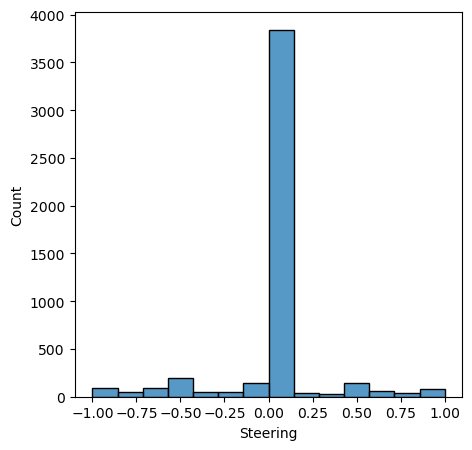

In [9]:
# Visualizing Steering feature
plt.figure(figsize=(5,5))
sns.histplot(df.Steering)
plt.show()

We see from the hist plot that the training data has steering angle mostly at 0.0. That is because in the simulation we drove the car mostly straight and very less steered towards left/right.
This might give rise to bias in the model and will predict more of 0.0 for steering as it would be trained on 0.0 more. So we need to balance the data so that the bias is eliminated.

In [10]:
len(df)
print(df.shape)

(4889, 7)


**Data Preprocessing**

In [11]:
# Checking for missing or null values

df.isnull().sum()

Center      0
Left        0
Right       0
Steering    0
Throttle    0
Reverse     0
Speed       0
dtype: int64

There are no missing or null values in the dataset

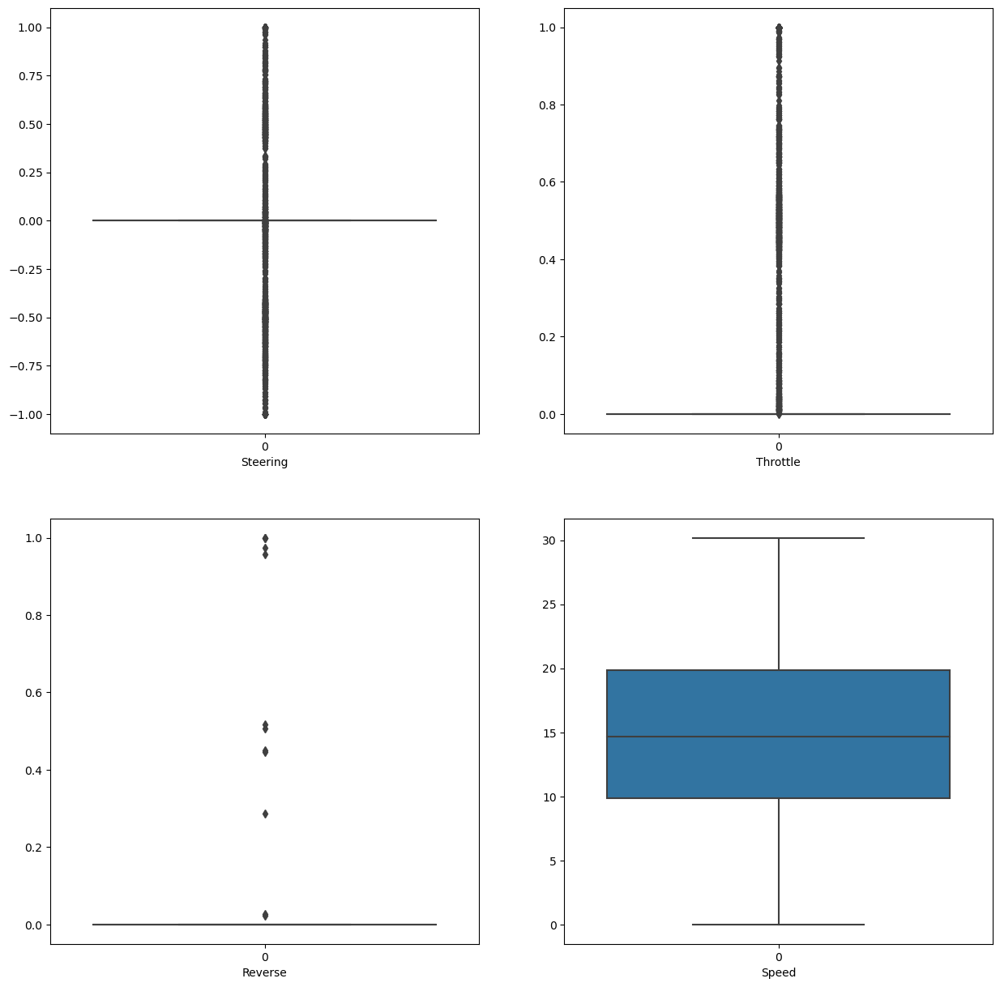

In [12]:
# Checking for outliers

plt.figure(figsize=(15,15))
pltnum = 1
data = df.drop(['Center','Left','Right'],axis=1)

for i in data:
    if pltnum<5:
        plt.subplot(2,2,pltnum)
        sns.boxplot(data[i])
        plt.xlabel(i,fontsize=10)
    pltnum+=1
plt.show()

In [13]:
#Using Empherical rule as Steering feature has normal distribution

smax = df.Steering.mean()+3*df.Steering.std()
smin = df.Steering.mean()-3*df.Steering.std()

print(len(df.loc[df.Steering>smax]))
print(len(df.loc[df.Steering<smin]))

91
88


In [14]:
91/4889*100

1.8613213336060543

In [15]:
# Replacing these outiers with mean of this feature
df.loc[df.Steering>smax,'Steering'] = df.Steering.mean()
df.loc[df.Steering<smin,'Steering'] = df.Steering.mean()

print(len(df.loc[df.Steering>smax]))
print(len(df.loc[df.Steering<smin]))

0
0


I would not be handling outliers of Throttle, Reverse and Speed as of now as I am focused and predicting based only on Steering angle

In [16]:
# Balancing the data

# Randomly removing instances with 0.0 value from Steering feature
zero_indices = df[df['Steering'] == 0.0].index
num_indices = int(len(zero_indices)*0.75)
indices_to_remove = np.random.choice(zero_indices, size=num_indices, replace=False)

df = df.drop(indices_to_remove)
print("Removed:",len(indices_to_remove))
print("Remaining:",len(df))

Removed: 2816
Remaining: 2073


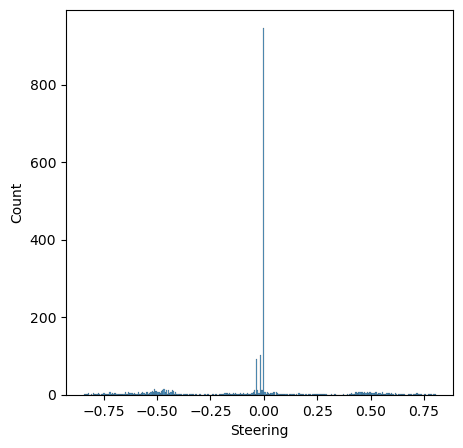

In [17]:
# Again viewing the Steering data
plt.figure(figsize=(5,5))
sns.histplot(df.Steering)
plt.show()

Data is now balanced

**Feature Selection**

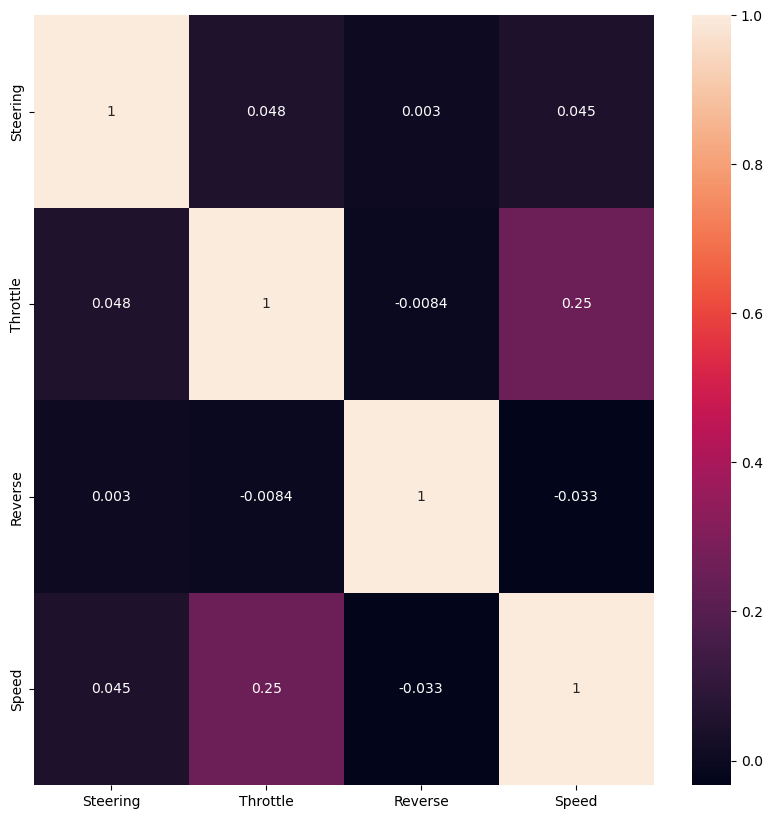

In [18]:
# Checking correlation of data

plt.figure(figsize=(10,10))
sns.heatmap(df.corr(),annot=True)
plt.show()

There is no high correlation between the features

In [19]:
# Checking for Duplicated rows
df.duplicated().sum()

0

There are no duplicate rows

**Model Building**

In [20]:
pwd

'C:\\Users\\divya\\Downloads\\My Projects\\Self driving Cars'

In [21]:
# Identifying independent and target features

datadir = 'Data'

def load_img_steering(datadir, df):
    image_path = []
    steering = []
    for i in range(len(df)):
        indexed_data = df.iloc[i]
        center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
        # Center image append
        image_path.append(os.path.join(datadir, str(center).strip()))
        steering.append(float(indexed_data[3]))
        # Left image append
        image_path.append(os.path.join(datadir,str(left).strip()))
        steering.append(float(indexed_data[3])+0.15)
        # Right image append
        image_path.append(os.path.join(datadir,str(right).strip()))
        steering.append(float(indexed_data[3])-0.15)
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)
    return image_paths, steerings

In [22]:
# image_paths being the independent variable and steerings being dependent/target variable
image_paths, steerings = load_img_steering(datadir, df)

In [23]:
image_paths

array(['Data\\center_2024_03_11_17_35_48_728.jpg',
       'Data\\left_2024_03_11_17_35_48_728.jpg',
       'Data\\right_2024_03_11_17_35_48_728.jpg', ...,
       'Data\\center_2024_03_11_17_56_16_824.jpg',
       'Data\\left_2024_03_11_17_56_16_824.jpg',
       'Data\\right_2024_03_11_17_56_16_824.jpg'], dtype='<U39')

In [24]:
steerings

array([ 0.  ,  0.15, -0.15, ...,  0.  ,  0.15, -0.15])

In [25]:
print(len(image_paths))
print(len(steerings))

6219
6219


**Training and Validation Split**

In [26]:
x_train, x_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=0)
print("Training set:",len(x_train))
print("Validation set:",len(x_valid))

Training set: 4975
Validation set: 1244


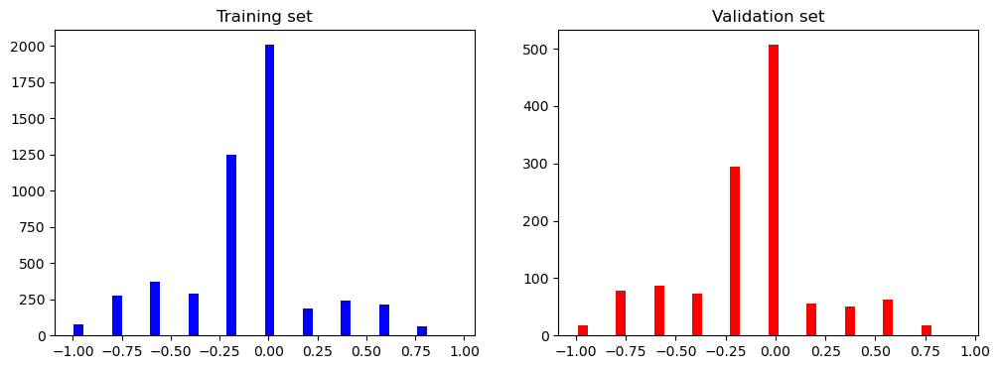

In [27]:
# Ploting distribution for Training and Validation sets

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, width=0.05, color='red')
axes[1].set_title('Validation set')
plt.show()

**Image Reading and Augmentation**

Text(0.5, 1.0, 'Zoomed Image')

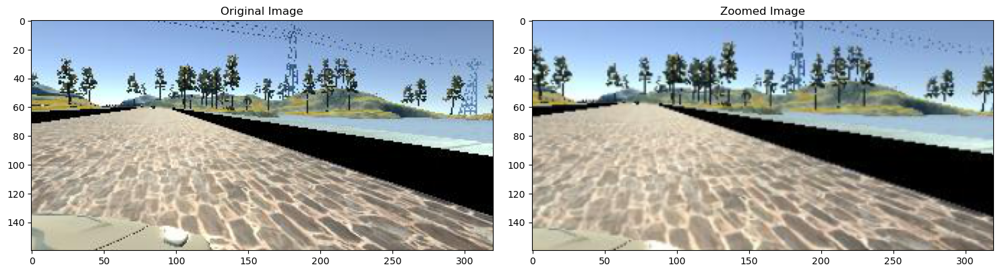

In [28]:
def zoom(image):
    zoom = iaa.Affine(scale=(1, 1.3))
    image = zoom.augment_image(image)
    return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

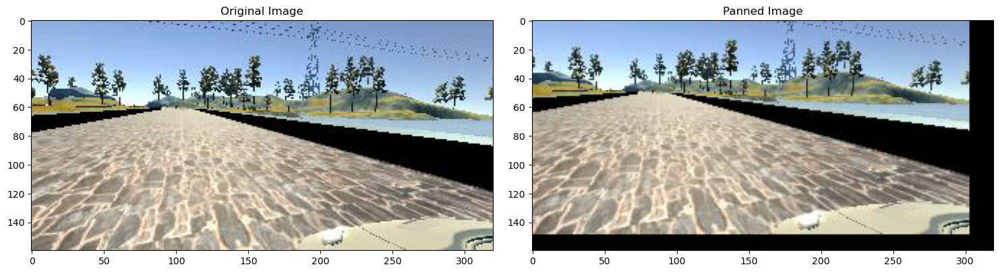

In [29]:
def pan(image):
    pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
    image = pan.augment_image(image)
    return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness altered image ')

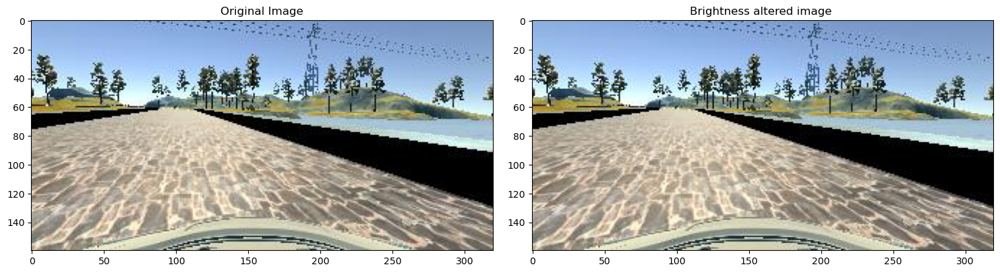

In [30]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)


fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

Text(0.5, 1.0, 'Flipped Image - Steering Angle:-0.0')

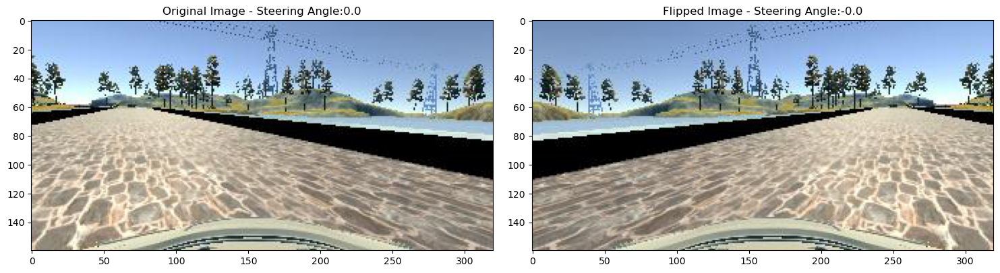

In [31]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle

random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

In [32]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = img_random_brightness(image)
    if np.random.rand() < 0.5:
        image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

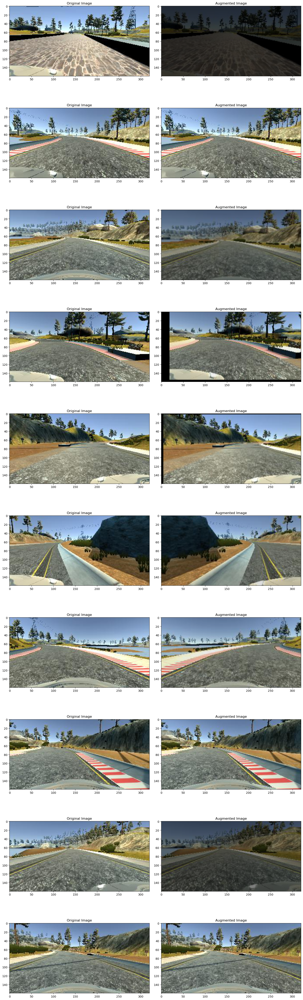

In [33]:
ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
    randnum = random.randint(0, len(image_paths) - 1)
    random_image = image_paths[randnum]
    random_steering = steerings[randnum]

    original_image = mpimg.imread(random_image)
    augmented_image, steering = random_augment(random_image, random_steering)

    axs[i][0].imshow(original_image)
    axs[i][0].set_title("Original Image")

    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title("Augmented Image")

**Image Preprocessing**

The images contain background like the trees, lake etc which is not really necessary for the model and moreover, these make the Convolution process complex and difficult to collect the features as it differs for each image. It may confuse the model. So I will be cropping the image so that I just have the road in my view point (removing sky and trees), which will make the process easier for the model.

As I will be using the NVIDIA model, I will have to convert the RGB image format into YUV format. After convertion, I am applying Guassian blur and then resizing the images to be compatible with NVIDIA's input size. Once all these are done, the raw images are then scaled.

In [34]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

Text(0.5, 1.0, 'Preprocessed Image')

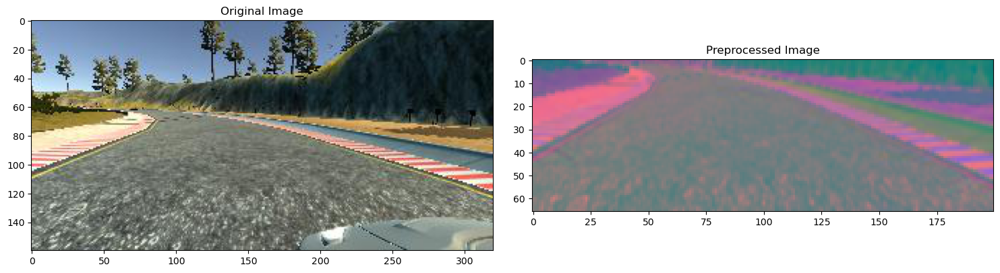

In [35]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

**Batch Generator:** In order to manage memory and make it easier for processing, I will be passing the images in batches.

In [36]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

      while True:
        batch_img = []
        batch_steering = []

        for i in range(batch_size):
            random_index = random.randint(0, len(image_paths) - 1)

            if istraining:
                im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

            else:
                im = mpimg.imread(image_paths[random_index])
                steering = steering_ang[random_index]

            im = img_preprocess(im)
            batch_img.append(im)
            batch_steering.append(steering)
        yield (np.asarray(batch_img), np.asarray(batch_steering))

In [37]:
x_train_gen, y_train_gen = next(batch_generator(x_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(x_valid, y_valid, 1, 0))

Text(0.5, 1.0, 'Validation Image')

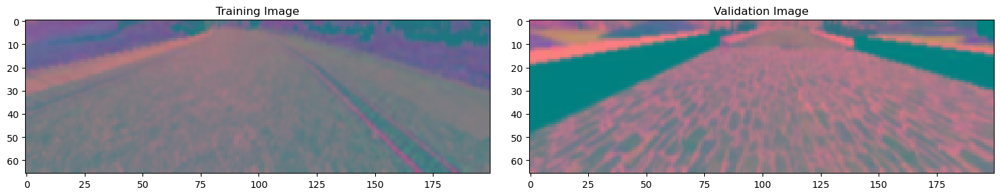

In [38]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

**Model Architecture:** NVIDIA model

In [39]:
def nvidia_model():
    model = Sequential()
    model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
    model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(64, (5, 5), activation='elu'))
    # model.add(Conv2D(64, (3,3), activation='elu'))
    # model.add(Dropout(0.5))

    model.add(Flatten())
    model.add(Dense(100, activation = 'elu'))
    # model.add(Dropout(0.5))
    model.add(Dense(50, activation = 'elu'))
    # model.add(Dropout(0.5))
    model.add(Dense(10, activation = 'elu'))
    # model.add(Dropout(0.5))
    model.add(Dense(1))

    # Compiling the model
    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
    model.compile(loss='mse', optimizer=optimizer)
    return model

model = nvidia_model()
print(model.summary())

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 31, 98, 24)          │           1,824 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 14, 47, 36)          │          21,636 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 5, 22, 48)           │          43,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 1, 18, 64)           │          76,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 1152)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 100)                 │         115,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 10)                  │             510 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              11 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 264,443 (1.01 MB)

 Trainable params: 264,443 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

None


In [40]:
# Training the model batchwise

history = model.fit(batch_generator(x_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(x_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 256s 846ms/step - loss: 0.3665 - val_loss: 0.0933
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 225s 750ms/step - loss: 0.0886 - val_loss: 0.0775
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 222s 740ms/step - loss: 0.0839 - val_loss: 0.0766
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 220s 737ms/step - loss: 0.0774 - val_loss: 0.0712
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 218s 728ms/step - loss: 0.0766 - val_loss: 0.0732
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 271s 904ms/step - loss: 0.0767 - val_loss: 0.0698
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 476s 2s/step - loss: 0.0749 - val_loss: 0.0713
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 357s 1s/step - loss: 0.0745 - val_loss: 0.0700
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 362s 1s/step - loss: 0.0740 - val_loss: 0.0709
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 365s 1s/step - loss: 0.0738 - val_loss: 0.0704


Text(0.5, 0, 'Epoch')

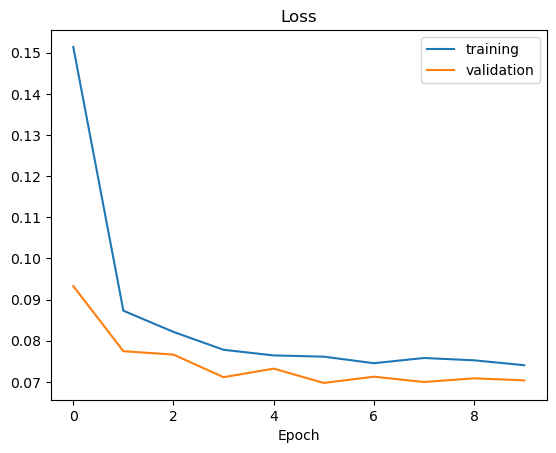

In [41]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [45]:
# Saving the model
model.save('model.keras')
# model.load_weights('model.h5')

**Model Evaluation**

In [65]:
train_score = model.evaluate(x_train_gen, y_train_gen, verbose=0)
train_accuracy = 100*train_score

val_score = model.evaluate(x_valid_gen, y_valid_gen, verbose=0)
val_accuracy = 100*val_score

print("Training accuracy is:",train_accuracy,"%")
print("Validation accuracy is:",val_accuracy,"%")

Training accuracy is: 2.384568378329277 %
Validation accuracy is: 0.49094851128757 %
